## COVID-19 in Nigeria: Rural-urban Socio-economic Implications

This project is part of a Capstone Project conducted to fulfil the requirements for completing the Coursera-IBM Data Science Professional Certificate Progam.

The COVID-19 pandemic has had varying impacts on countries, and on regions within each Country. Nigeria is no exception. The pandemic - infections, testing, deaths - has exposed some of the pre-existing disparities in both social and economic factors, some of which have accentuated the differences in the severity of the impact from region to region. While some governments are aware of some of these disparities and their effects on the severity of the pandemic, many governments are met with the current challenge of dealing with response to the virus in real-time, with little effort or resources to spare in a more wholistic view of the challenge for a more coordinated response. Furthermore, a better understanding of this wholistic view vis-a-vis socio-economic indicators, will help the Nigerian government better prepare for whatever future pandemics or epidemics may occur.

Population density, access to healthcare facilities, and the economic wherewhital to ride such a disruptive event, are some of the factors that will be explored in this project.  Data will be accessed from the Nigeria Bureau of Statistics. 

The data will comprise:

a. Population Density in Nigeria by State

b. Consumer Price Index by State

c. Unemployment Data by State

d. COVID-19 latest Data by State

Foursquare location data will be utilized to assess availability of healthcare services in specific cities and neighbourhoods. The information from Foursquare will be juxtaposed with the COVID-19 data and other data sets to assess its effects on pandemic severity. Where data is sparse via Foursquare location data, other location data sources will be utilized.

Ultimately, the government of Nigeria, both at the National and State level, should find this assessment useful for planning and implementation, and for better preparedness for future public health crises that may occur.

In [1]:
# IMPORTING REQUIRED LIBRARIES
import numpy as np
import pandas as pd

!pip install geopy
from geopy.geocoders import Nominatim

!pip install folium==0.5.0
import folium

import json
from pandas.io.json import json_normalize

import requests

import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.cluster import KMeans
from sklearn.datasets.samples_generator import make_blobs

!pip install seaborn
import seaborn as sns
%matplotlib inline

     |████████████████████████████████| 79 kB 10.2 MB/s eta 0:00:01
  Created wheel for folium: filename=folium-0.5.0-py3-none-any.whl size=76240 sha256=bef76d7350852665bc1803d595876810f4260f6d0e327a4f1ac73aec6bf72c63
  Stored in directory: /tmp/wsuser/.cache/pip/wheels/b2/2f/2c/109e446b990d663ea5ce9b078b5e7c1a9c45cca91f377080f8
Successfully built folium


/opt/conda/envs/Python-3.7-main/lib/python3.7/site-packages/sklearn/utils/deprecation.py:143: FutureWarning: The sklearn.datasets.samples_generator module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.datasets. Anything that cannot be imported from sklearn.datasets is now part of the private API.
  warnings.warn(message, FutureWarning)


# Import Datasets from Source
Importing Population Data

In [2]:
#population data
path1 = pd.ExcelFile('https://nigerianstat.gov.ng/resource/POPULATION%20PROJECTION%20Nigeria%20sgfn.xls')
Population = pd.read_excel(path1, 'POPULATION PROJECTION', header=1)
Population=Population[0:37]
Population.iloc[36, Population.columns.get_loc('STATE')] = 'FCT'  #change name of Abuja to FCT to be consistent with other datasets
Population.iloc[2, Population.columns.get_loc('STATE')] = 'AKWA IBOM'  #change name of Abuja to FCT to be consistent with other datasets
Population.head()

,STATE,POPULATION (2006),ANNUAL % GR,ANNUAL G.R,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
0,ABIA,2845380,2.7,0.027,2.923252e+06,3.003255e+06,3.085447e+06,3.169889e+06,3.256642e+06,3.345769e+06,3.437336e+06,3.531408e+06,3.628055e+06,3.727347e+06
1,ADAMAWA,3178950,2.9,0.029,3.272489e+06,3.368781e+06,3.467906e+06,3.569948e+06,3.674992e+06,3.783127e+06,3.894444e+06,4.009037e+06,4.127001e+06,4.248436e+06
2,AKWA IBOM,3902051,3.4,0.034,4.037002e+06,4.176620e+06,4.321067e+06,4.470509e+06,4.625120e+06,4.785078e+06,4.950568e+06,5.121781e+06,5.298916e+06,5.482177e+06
3,ANAMBRA,4177828,2.8,0.028,4.296460e+06,4.418461e+06,4.543926e+06,4.672954e+06,4.805646e+06,4.942106e+06,5.082440e+06,5.226760e+06,5.375177e+06,5.527809e+06
4,BAUCHI,4653066,3.4,0.034,4.813990e+06,4.980480e+06,5.152728e+06,5.330933e+06,5.515302e+06,5.706046e+06,5.903388e+06,6.107554e+06,6.318781e+06,6.537314e+06


In [3]:
Population = Population.sort_values('STATE').reset_index(drop=True)  #sorting rows based on states
Population.head()

,STATE,POPULATION (2006),ANNUAL % GR,ANNUAL G.R,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
0,ABIA,2845380,2.7,0.027,2.923252e+06,3.003255e+06,3.085447e+06,3.169889e+06,3.256642e+06,3.345769e+06,3.437336e+06,3.531408e+06,3.628055e+06,3.727347e+06
1,ADAMAWA,3178950,2.9,0.029,3.272489e+06,3.368781e+06,3.467906e+06,3.569948e+06,3.674992e+06,3.783127e+06,3.894444e+06,4.009037e+06,4.127001e+06,4.248436e+06
2,AKWA IBOM,3902051,3.4,0.034,4.037002e+06,4.176620e+06,4.321067e+06,4.470509e+06,4.625120e+06,4.785078e+06,4.950568e+06,5.121781e+06,5.298916e+06,5.482177e+06
3,ANAMBRA,4177828,2.8,0.028,4.296460e+06,4.418461e+06,4.543926e+06,4.672954e+06,4.805646e+06,4.942106e+06,5.082440e+06,5.226760e+06,5.375177e+06,5.527809e+06
4,BAUCHI,4653066,3.4,0.034,4.813990e+06,4.980480e+06,5.152728e+06,5.330933e+06,5.515302e+06,5.706046e+06,5.903388e+06,6.107554e+06,6.318781e+06,6.537314e+06


In [4]:
Population['STATE'] = Population['STATE'].str.title() #convert state names to title case from upper case
Population.head()

,STATE,POPULATION (2006),ANNUAL % GR,ANNUAL G.R,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
0,Abia,2845380,2.7,0.027,2.923252e+06,3.003255e+06,3.085447e+06,3.169889e+06,3.256642e+06,3.345769e+06,3.437336e+06,3.531408e+06,3.628055e+06,3.727347e+06
1,Adamawa,3178950,2.9,0.029,3.272489e+06,3.368781e+06,3.467906e+06,3.569948e+06,3.674992e+06,3.783127e+06,3.894444e+06,4.009037e+06,4.127001e+06,4.248436e+06
2,Akwa Ibom,3902051,3.4,0.034,4.037002e+06,4.176620e+06,4.321067e+06,4.470509e+06,4.625120e+06,4.785078e+06,4.950568e+06,5.121781e+06,5.298916e+06,5.482177e+06
3,Anambra,4177828,2.8,0.028,4.296460e+06,4.418461e+06,4.543926e+06,4.672954e+06,4.805646e+06,4.942106e+06,5.082440e+06,5.226760e+06,5.375177e+06,5.527809e+06
4,Bauchi,4653066,3.4,0.034,4.813990e+06,4.980480e+06,5.152728e+06,5.330933e+06,5.515302e+06,5.706046e+06,5.903388e+06,6.107554e+06,6.318781e+06,6.537314e+06


In [5]:
#checking for data type
Population.dtypes

STATE                 object
POPULATION (2006)      int64
ANNUAL % GR          float64
ANNUAL G.R           float64
2007                 float64
2008                 float64
2009                 float64
2010                 float64
2011                 float64
2012                 float64
2013                 float64
2014                 float64
2015                 float64
2016                 float64
dtype: object

In [6]:
Population.shape

(37, 14)

In [43]:
#cleaning up data
#new_header = Population.iloc[1] 
#Population = Population[2:] 
#Population.columns = new_header
#Population=Population.reset_index(drop=True)
#Population.head()

Importing Consumer Price Index Data

In [7]:
#Consumper Price Index Data
path2=pd.ExcelFile('https://nigerianstat.gov.ng/resource/cpi_1NewNOVEMBER2020.xls')
CPI=pd.read_excel(path2,'Table-5', header=9)
CPI.head()

,Unnamed: 0,State,Food,All,Food .1,All.1,Food .2,All.2,Unnamed: 8
0,NaN,NaN,NaN,Items,NaN,Items,NaN,Items,NaN
1,NaN,Abia,334.52,307.64,380.94,343.94,388.61,348.44,NaN
2,NaN,Abuja,337.68,300.27,389.95,337.83,394.40,342.61,NaN
3,NaN,Adamawa,336.63,295.91,388.25,336.67,395.89,341.98,NaN
4,NaN,Akwa Ibom,335.48,299.66,392.6,342.58,394.97,345.23,NaN


In [8]:
#cleaning up the data
CPI.columns=['Unnamed', 'STATE', 'Food-Nov19','All-Nov19','Food-Oct20','All-Oct20','Food-Nov20','All-Nov20','Unnamed1'] #change column names based on excel workbook
CPI = CPI[1:38]                               #easy way to remove first row
CPI=CPI.drop(columns=['Unnamed', 'Unnamed1']) #drop first and last columns
CPI=CPI.reset_index(drop=True)                #reset index
CPI.iloc[1, CPI.columns.get_loc('STATE')] = 'FCT'  #change name of Abuja to FCT to be consistent with other datasets
CPI['STATE'] = CPI['STATE'].str.upper() 
CPI.head()

,STATE,Food-Nov19,All-Nov19,Food-Oct20,All-Oct20,Food-Nov20,All-Nov20
0,ABIA,334.52,307.64,380.94,343.94,388.61,348.44
1,FCT,337.68,300.27,389.95,337.83,394.40,342.61
2,ADAMAWA,336.63,295.91,388.25,336.67,395.89,341.98
3,AKWA IBOM,335.48,299.66,392.6,342.58,394.97,345.23
4,ANAMBRA,335.67,309.49,389.94,350.84,399.67,357.68


In [ ]:
#header_row = 1
#Population.columns = Population.iloc[header_row]
#Population = Population.drop(header_row)
#Population=Population[Population['ANNUAL G.R']!='NaN']
#Population=Population.reset_index(drop=True)
#Population.head()

In [9]:
CPI=CPI.sort_values('STATE').reset_index(drop=True) 
CPI.head()

,STATE,Food-Nov19,All-Nov19,Food-Oct20,All-Oct20,Food-Nov20,All-Nov20
0,ABIA,334.52,307.64,380.94,343.94,388.61,348.44
1,ADAMAWA,336.63,295.91,388.25,336.67,395.89,341.98
2,AKWA IBOM,335.48,299.66,392.6,342.58,394.97,345.23
3,ANAMBRA,335.67,309.49,389.94,350.84,399.67,357.68
4,BAUCHI,309.49,331.74,350.84,387.94,357.68,396.99


In [10]:
CPI['STATE'] = CPI['STATE'].str.title() #convert state names to title case from upper case
CPI.head()

,STATE,Food-Nov19,All-Nov19,Food-Oct20,All-Oct20,Food-Nov20,All-Nov20
0,Abia,334.52,307.64,380.94,343.94,388.61,348.44
1,Adamawa,336.63,295.91,388.25,336.67,395.89,341.98
2,Akwa Ibom,335.48,299.66,392.6,342.58,394.97,345.23
3,Anambra,335.67,309.49,389.94,350.84,399.67,357.68
4,Bauchi,309.49,331.74,350.84,387.94,357.68,396.99


In [73]:
##dropping a row 
#indexNames = CPI[ CPI['STATE'] == 'FCT' ].index
#CPI.drop(indexNames , inplace=True)
#CPI.head()

In [11]:
CPI.dtypes

STATE          object
Food-Nov19    float64
All-Nov19      object
Food-Oct20     object
All-Oct20      object
Food-Nov20    float64
All-Nov20      object
dtype: object

In [12]:
#changing datatype of integer columns to integers

CPI[['Food-Nov19','All-Nov19','Food-Oct20','All-Oct20','Food-Nov20','All-Nov20']] = CPI[['Food-Nov19','All-Nov19','Food-Oct20','All-Oct20','Food-Nov20','All-Nov20']].apply(pd.to_numeric) 
print(CPI.dtypes)

STATE          object
Food-Nov19    float64
All-Nov19     float64
Food-Oct20    float64
All-Oct20     float64
Food-Nov20    float64
All-Nov20     float64
dtype: object


In [13]:
CPI.shape

(37, 7)

Importing Employment Data

In [14]:
#employment data
path3=pd.ExcelFile('https://nigerianstat.gov.ng/resource/Unemplyment%20Data%20Series%20by%20State%20-%20q2%202020.xlsx')
Employment=pd.read_excel(path3,'LFS STATE', header=2)
Employment.head()

,Unnamed: 0,Unnamed: 1,Fully Employed,Under-employed,Unemployed,Unemployed.1,Unnamed: 6,OLD Nigeria,NEW Nigeria,International,Unnamed: 10
0,Total,80291894.0,35585273.7,22942002.6,12395363.9,9369253.3,21764617.2,55.680116,27.106867,11.668990,28.573249
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,ABIA,1605289.8,475996.9,558683.9,344774.1,225834.9,570609.0,70.348226,35.545544,14.068170,34.802682
3,ADAMAWA,1789608.9,578421.1,687469.2,403915.2,119803.4,523718.6,67.678910,29.264416,6.694390,38.414494
4,AKWA-IBOM,2534494.6,838994.8,551101.2,543238.1,601160.6,1144398.7,66.896962,45.152935,23.719151,21.744027


In [15]:
#cleaning up data
Employment.columns=['STATE','Labour-Force', 'Fully Employed', 'Under-Employed','Part-Unemployed','Unemployed','Total Unemployed','Old-Nig Unempl Rate','New-Nig Unempl Rate','Intl Unempl Rate','Under-Empl Rate']
Employment=Employment[2:39]
Employment=Employment.reset_index(drop=True)
Employment.iloc[2, Population.columns.get_loc('STATE')] = 'AKWA IBOM'  #change name of Abuja to FCT to be consistent with other datasets
Employment.head()

,STATE,Labour-Force,Fully Employed,Under-Employed,Part-Unemployed,Unemployed,Total Unemployed,Old-Nig Unempl Rate,New-Nig Unempl Rate,Intl Unempl Rate,Under-Empl Rate
0,ABIA,1605289.8,475996.9,558683.9,344774.1,225834.9,570609.0,70.348226,35.545544,14.068170,34.802682
1,ADAMAWA,1789608.9,578421.1,687469.2,403915.2,119803.4,523718.6,67.678910,29.264416,6.694390,38.414494
2,AKWA IBOM,2534494.6,838994.8,551101.2,543238.1,601160.6,1144398.7,66.896962,45.152935,23.719151,21.744027
3,ANAMBRA,2256434.7,1575933.7,384175.9,147571.6,148753.5,296325.1,30.158240,13.132447,6.592413,17.025793
4,BAUCHI,2535660.9,890183.6,1090070.0,441737.3,113670.0,555407.3,64.893429,21.903848,4.482855,42.989581


In [16]:
Employment = Employment.sort_values('STATE').reset_index(drop=True) 
Employment.head()

,STATE,Labour-Force,Fully Employed,Under-Employed,Part-Unemployed,Unemployed,Total Unemployed,Old-Nig Unempl Rate,New-Nig Unempl Rate,Intl Unempl Rate,Under-Empl Rate
0,ABIA,1605289.8,475996.9,558683.9,344774.1,225834.9,570609.0,70.348226,35.545544,14.068170,34.802682
1,ADAMAWA,1789608.9,578421.1,687469.2,403915.2,119803.4,523718.6,67.678910,29.264416,6.694390,38.414494
2,AKWA IBOM,2534494.6,838994.8,551101.2,543238.1,601160.6,1144398.7,66.896962,45.152935,23.719151,21.744027
3,ANAMBRA,2256434.7,1575933.7,384175.9,147571.6,148753.5,296325.1,30.158240,13.132447,6.592413,17.025793
4,BAUCHI,2535660.9,890183.6,1090070.0,441737.3,113670.0,555407.3,64.893429,21.903848,4.482855,42.989581


In [17]:
Employment['STATE'] = Employment['STATE'].str.title() #convert state names to title case from upper case
Employment.head()

,STATE,Labour-Force,Fully Employed,Under-Employed,Part-Unemployed,Unemployed,Total Unemployed,Old-Nig Unempl Rate,New-Nig Unempl Rate,Intl Unempl Rate,Under-Empl Rate
0,Abia,1605289.8,475996.9,558683.9,344774.1,225834.9,570609.0,70.348226,35.545544,14.068170,34.802682
1,Adamawa,1789608.9,578421.1,687469.2,403915.2,119803.4,523718.6,67.678910,29.264416,6.694390,38.414494
2,Akwa Ibom,2534494.6,838994.8,551101.2,543238.1,601160.6,1144398.7,66.896962,45.152935,23.719151,21.744027
3,Anambra,2256434.7,1575933.7,384175.9,147571.6,148753.5,296325.1,30.158240,13.132447,6.592413,17.025793
4,Bauchi,2535660.9,890183.6,1090070.0,441737.3,113670.0,555407.3,64.893429,21.903848,4.482855,42.989581


In [18]:
Employment.dtypes

STATE                   object
Labour-Force           float64
Fully Employed         float64
Under-Employed         float64
Part-Unemployed        float64
Unemployed             float64
Total Unemployed       float64
Old-Nig Unempl Rate    float64
New-Nig Unempl Rate    float64
Intl Unempl Rate       float64
Under-Empl Rate        float64
dtype: object

In [19]:
Employment.shape

(37, 11)

## Downloading Json Files
Download Nigeria's Covid Data

In [20]:
# download Nigeria's covid-19 geojson file
!wget -q -O '9ca1fdd1841543b7b079ba97e52df85a_0.geojson' https://opendata.arcgis.com/datasets/9ca1fdd1841543b7b079ba97e52df85a_0.geojson
print('Data downloaded!')

Data downloaded!


In [21]:
with open('9ca1fdd1841543b7b079ba97e52df85a_0.geojson') as json_data:
    Naija_data = json.load(json_data)

In [22]:
#exploring the geojson file
Covid_data = Naija_data['features']
Covid_data[5]

{'type': 'Feature',
 'properties': {'OBJECTID': 6,
  'CODE': 'NG006',
  'STATE': 'Bayelsa',
  'ADMIN_NAME': 'Bayelsa State',
  'GEO_ZONE': 'South South',
  'AREA_SQKM': 9546.42,
  'POP_2016': 2228965,
  'CENTER_Y': 4.766315328,
  'CENTER_X': 6.08041884,
  'CASES': 608,
  'DEATHS': 23,
  'RECOVERED': 539,
  'ACTIVE': 46,
  'NEW_CASES': 0,
  'NEW_DEATH': 0,
  'NEW_DISCHARGED': 0,
  'SCREENED': 10268},
 'geometry': {'type': 'Point',
  'coordinates': [6.08041884000005, 4.76631532800008]}}

Extracting Data from the COVID JSON file

In [23]:
#initializing the dataframe for covid 19 data from the json file
column_names=['STATE','POP_2016','LATITUDE','LONGITUDE','AREA','CASES','DEATHS','RECOVERED','ACTIVE','SCREENED']

COVID19_data = pd.DataFrame(columns=column_names)

In [24]:
for data in Covid_data:
    state_name = data['properties']['STATE'] 
    population_2016 = data['properties']['POP_2016']
    state_lat = data['properties']['CENTER_Y']
    state_lon = data['properties']['CENTER_X']
    state_size = data['properties']['AREA_SQKM']
    state_cases = data['properties']['CASES']
    state_deaths = data['properties']['DEATHS']
    state_rec = data['properties']['RECOVERED']
    state_active = data['properties']['ACTIVE']
    state_tested = data['properties']['SCREENED']
    
    COVID19_data = COVID19_data.append({'STATE': state_name,
                                          'POP_2016': population_2016,
                                          'LATITUDE': state_lat,
                                          'LONGITUDE': state_lon,
                                          'AREA': state_size,
                                          'CASES': state_cases,
                                          'DEATHS': state_deaths,
                                          'RECOVERED': state_rec,
                                          'ACTIVE': state_active,
                                          'SCREENED': state_tested}, ignore_index=True)

In [25]:
COVID19_data=COVID19_data[0:37]
COVID19_data.head()

,STATE,POP_2016,LATITUDE,LONGITUDE,AREA,CASES,DEATHS,RECOVERED,ACTIVE,SCREENED
0,Abia,3644714,5.453302,7.523190,4858.88,1134,11,1014,109,14627
1,Adamawa,4145684,9.323227,12.400241,37924.99,540,26,238,276,8733
2,Akwa Ibom,5353609,4.907245,7.846395,6723.20,667,9,422,236,7312
3,Anambra,5425334,6.222776,6.932186,4807.93,515,20,334,161,11890
4,Bauchi,6386388,10.796647,9.990588,48496.40,1107,17,964,126,13917


In [26]:
COVID19_data.iloc[14, COVID19_data.columns.get_loc('STATE')] = 'Fct'  #change name of FCT to Fct to be consistent with other datasets

In [27]:
COVID19_data.shape

(37, 10)

In [28]:
#checking for data types of columns
COVID19_data.dtypes

STATE         object
POP_2016      object
LATITUDE     float64
LONGITUDE    float64
AREA         float64
CASES         object
DEATHS        object
RECOVERED     object
ACTIVE        object
SCREENED      object
dtype: object

In [29]:
#changing datatype of integer columns to integers

COVID19_data[['POP_2016','AREA','CASES','DEATHS','RECOVERED','ACTIVE','SCREENED']] = COVID19_data[['POP_2016','AREA','CASES','DEATHS','RECOVERED','ACTIVE','SCREENED']].apply(pd.to_numeric) 
print(COVID19_data.dtypes)

STATE         object
POP_2016       int64
LATITUDE     float64
LONGITUDE    float64
AREA         float64
CASES          int64
DEATHS         int64
RECOVERED      int64
ACTIVE         int64
SCREENED       int64
dtype: object


Downloading Nigeria's Health-Access Data

In [30]:
# Downloading Nigeria Health-Access Data
!wget -q -O 'ceabba4071a64c0ca2420ee3656b37ae_0.geojson' https://opendata.arcgis.com/datasets/ceabba4071a64c0ca2420ee3656b37ae_0.geojson
print('Data downloaded!')

Data downloaded!


In [31]:
with open('ceabba4071a64c0ca2420ee3656b37ae_0.geojson') as json_data:
    Naija_data2 = json.load(json_data)

In [32]:
#exploring the geojson file
HealthAccess_data = Naija_data2['features']
HealthAccess_data[1]

{'type': 'Feature',
 'properties': {'OBJECTID': 2,
  'editor': 'abraham.oluseye',
  'statecode': 'AD',
  'statename': 'Adamawa',
  'capcity': 'Yola',
  'source': 'eHA_Polio',
  'timestamp': '2018/12/13 00:31:33+00',
  'globalid': '7d2a1c11-b5cb-45f3-b61e-7645aade9903',
  'geozone': 'NEZ',
  'id': 1075,
  'nga_accessibility_profile_ctg': 2.054538,
  'Shape__Area': 3.28726710847172,
  'Shape__Length': 12.1489915875901},
 'geometry': {'type': 'Polygon',
  'coordinates': [[[12.20156948, 8.10679170700007],
    [12.2015180830001, 8.10679170700007],
    [12.199443817, 8.07416534400005],
    [12.201665878, 8.04249954200003],
    [12.209423192, 8.00343713100006],
    [12.2211303710001, 7.99450683600003],
    [12.218984768, 7.99125676100005],
    [12.2142944340001, 7.99029541000004],
    [12.2130737310001, 7.98748779300007],
    [12.2136265250001, 7.98245222200006],
    [12.2109038900001, 7.98293466300004],
    [12.2094051710001, 7.98124612100003],
    [12.2100082220001, 7.97738659700008],
    [

In [33]:
#initializing the dataframe for covid 19 data from the json file
column_names1=['STATE','HEALTH_ACCESS']

HealthAccess = pd.DataFrame(columns=column_names1)

In [34]:
for data in HealthAccess_data:
    state_name = data['properties']['statename'] 
    state_healthaccess = data['properties']['nga_accessibility_profile_ctg']
        
    HealthAccess = HealthAccess.append({'STATE': state_name,
                                          'HEALTH_ACCESS': state_healthaccess}, ignore_index=True)

In [35]:
HealthAccess = HealthAccess.sort_values('STATE').reset_index(drop=True)
HealthAccess.head()

,STATE,HEALTH_ACCESS
0,Abia,1.957754
1,Adamawa,2.054538
2,Akwa Ibom,2.731196
3,Anambra,1.773679
4,Bauchi,1.816598


In [36]:
HealthAccess.dtypes

STATE             object
HEALTH_ACCESS    float64
dtype: object

## Creating Maps
Creating Choropleth Map

In [37]:
#json file for choropleth map
naija_geo = 'ceabba4071a64c0ca2420ee3656b37ae_0.geojson' # geojson file

In [38]:
# create a map of Nigeria for covid-19 Screened
address = 'Nigeria'

geolocator = Nominatim(user_agent="Naij_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Nigeria are {}, {}.'.format(latitude, longitude))

#Create Nigeria Map
Naija_map = folium.Map(location=[latitude, longitude], zoom_start=6)

The geograpical coordinate of Nigeria are 9.6000359, 7.9999721.


In [39]:
# generate choropleth map for covid-19 Screening in Nigeria
Naija_map.choropleth(
    geo_data=naija_geo,
    data=COVID19_data,
    columns=['STATE', 'SCREENED'],
    key_on='properties.statename',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='COVID-19 Screening in Nigeria'
)

# display map
Naija_map

In [40]:
# create a map of Nigeria for covid-19 Cases
address = 'Nigeria'

geolocator = Nominatim(user_agent="Naij_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Nigeria are {}, {}.'.format(latitude, longitude))

#Create Nigeria Map
Naija_map1 = folium.Map(location=[latitude, longitude], zoom_start=6)

The geograpical coordinate of Nigeria are 9.6000359, 7.9999721.


In [41]:
# generate choropleth map for covid-19 cases in Nigeria
Naija_map1.choropleth(
    geo_data=naija_geo,
    data=COVID19_data,
    columns=['STATE', 'CASES'],
    key_on='properties.statename',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='COVID-19 Cases in Nigeria'
)

# display map
Naija_map1

In [42]:
# create a map of Nigeria for covid-19 DEATHS
address = 'Nigeria'

geolocator = Nominatim(user_agent="Naij_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Nigeria are {}, {}.'.format(latitude, longitude))

#Create Nigeria Map
Naija_map2 = folium.Map(location=[latitude, longitude], zoom_start=6)

The geograpical coordinate of Nigeria are 9.6000359, 7.9999721.


In [43]:
# generate choropleth map for covid-19 DEATHS in Nigeria
Naija_map2.choropleth(
    geo_data=naija_geo,
    data=COVID19_data,
    columns=['STATE', 'DEATHS'],
    key_on='properties.statename',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='COVID-19 Deaths in Nigeria'
)

# display map
Naija_map2

In [44]:
# create a map of Nigeria for Health Access
address = 'Nigeria'

geolocator = Nominatim(user_agent="Naij_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Nigeria are {}, {}.'.format(latitude, longitude))

#Create Nigeria Map
Naija_map3 = folium.Map(location=[latitude, longitude], zoom_start=6)

The geograpical coordinate of Nigeria are 9.6000359, 7.9999721.


In [45]:
# generate choropleth map for Health Access in Nigeria
Naija_map3.choropleth(
    geo_data=naija_geo,
    data=HealthAccess,
    columns=['STATE', 'HEALTH_ACCESS'],
    key_on='properties.statename',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Health Access Index in Nigeria'
)

# display map
Naija_map3

## USE OF FOURSQUARE TO ACCESS NUMBER OF HEALTH-RELATED VENUES IN EACH STATE

In [46]:
# The code was removed by Watson Studio for sharing.

'4bf58dd8d48988d104941735'

In [48]:
#check random state data
stateindex=5
COVID19_data.loc[stateindex,'STATE']

'Bayelsa'

In [49]:
state_latitude = COVID19_data.loc[stateindex, 'LATITUDE'] # neighborhood latitude value
state_longitude = COVID19_data.loc[stateindex, 'LONGITUDE'] # neighborhood longitude value

state_name = COVID19_data.loc[stateindex, 'STATE'] # neighborhood name

print('Latitude and longitude values of {} are {}, {}.'.format(state_name, 
                                                               state_latitude, 
                                                               state_longitude))

Latitude and longitude values of Bayelsa are 4.766315328, 6.08041884.


Retrieve top 100 venues within 500ft from center of Random State

In [50]:
radius=100000
url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&categoryId={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    state_latitude, 
    state_longitude, 
    radius, 
    LIMIT,
    categoryID)

url

'https://api.foursquare.com/v2/venues/explore?&client_id=EFEDMCWJ5W5AELBHW1SLSWMLFEF4RGVOJE2QNMJUJYBL5N0L&client_secret=GH2WQ51JE13OZZH2SFBR3CQVZOLVMCNIYSFVDVYLCQRA433V&v=20180605&ll=4.766315328,6.08041884&radius=100000&limit=100&categoryId=4bf58dd8d48988d104941735'

In [51]:
results = requests.get(url).json()
results

{'meta': {'code': 200, 'requestId': '600cca4c90223619e784fb5a'},
 'response': {'warning': {'text': "There aren't a lot of results near you. Try something more general, reset your filters, or expand the search area."},
  'headerLocation': 'Current map view',
  'headerFullLocation': 'Current map view',
  'headerLocationGranularity': 'unknown',
  'query': 'medical',
  'totalResults': 1,
  'suggestedBounds': {'ne': {'lat': 5.6663162280009, 'lng': 6.981856613577673},
   'sw': {'lat': 3.8663144279991, 'lng': 5.1789810664223275}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '4e2bdefc45dd3272c81797a1',
       'name': 'University Of Port Harcourt Teaching Hospital',
       'location': {'lat': 4.897945614206533,
        'lng': 6.929784572543609,
        'labeledLatLngs': [{'lab

In [52]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [53]:
venues = results['response']['groups'][0]['items']
    
nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

#nearby_venues.head()
nearby_venues

/opt/conda/envs/Python-3.7-main/lib/python3.7/site-packages/ipykernel/__main__.py:3: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  app.launch_new_instance()


,name,categories,lat,lng
0,University Of Port Harcourt Teaching Hospital,Hospital,4.897946,6.929785


In [54]:
nearby_venues.shape

(1, 4)

In [55]:
#defining function for multiple states
def getNearbyVenues(names, latitudes, longitudes, radius=100000):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&categoryId={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT,
            categoryID)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['STATE', 
                  'STATE Latitude', 
                  'STATE Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [56]:
Medical_facilities = getNearbyVenues(names=COVID19_data['STATE'],
                                   latitudes=COVID19_data['LATITUDE'],
                                   longitudes=COVID19_data['LONGITUDE']
                                  )

Abia
Adamawa
Akwa Ibom
Anambra
Bauchi
Bayelsa
Benue
Borno
Cross River
Delta
Ebonyi
Edo
Ekiti
Enugu
Fct
Gombe
Imo
Jigawa
Kaduna
Kano
Katsina
Kebbi
Kogi
Kwara
Lagos
Nasarawa
Niger
Ogun
Ondo
Osun
Oyo
Plateau
Rivers
Sokoto
Taraba
Yobe
Zamfara


In [57]:
print(Medical_facilities.shape)
Medical_facilities

(323, 7)


,STATE,STATE Latitude,STATE Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Abia,5.453302,7.523190,Pearl Medical Centre,4.797574,7.000609,Medical Center
1,Abia,5.453302,7.523190,First Rivers Hospital LTD,4.836318,7.022918,Hospital
2,Abia,5.453302,7.523190,University Of Port Harcourt Teaching Hospital,4.897946,6.929785,Hospital
3,Abia,5.453302,7.523190,Garden City Clinic,4.799456,7.003838,Hospital
4,Abia,5.453302,7.523190,Meridian Hospitals,4.803736,6.996882,Hospital
...,...,...,...,...,...,...,...
318,Sokoto,13.037993,5.318810,State Veterinary Clinic,13.060307,5.225605,Veterinarian
319,Sokoto,13.037993,5.318810,State Veterinary Clinic,13.068910,5.214330,Veterinarian
320,Taraba,8.023131,10.786479,Ereğli Devlet Hastanesi Odyoloji Ünitesi,7.388268,10.157113,Medical Center
321,Yobe,12.376215,11.393266,Potiskum Genral Hospital,11.722001,11.068503,Hospital


In [58]:
FoursquareData=Medical_facilities.groupby('STATE').count()

In [59]:
FoursquareData.head()

,STATE Latitude,STATE Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
STATE,,,,,,
Abia,5,5,5,5,5,5
Adamawa,7,7,7,7,7,7
Akwa Ibom,4,4,4,4,4,4
Anambra,35,35,35,35,35,35
Bauchi,8,8,8,8,8,8


In [60]:
FoursquareData=FoursquareData.reset_index()
FoursquareData.head()

,STATE,STATE Latitude,STATE Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Abia,5,5,5,5,5,5
1,Adamawa,7,7,7,7,7,7
2,Akwa Ibom,4,4,4,4,4,4
3,Anambra,35,35,35,35,35,35
4,Bauchi,8,8,8,8,8,8


In [61]:
FSData=FoursquareData[['STATE','Venue']].copy()
FSData.columns=['STATE','No_of_Hospitals']
FSData.head()

,STATE,No_of_Hospitals
0,Abia,5
1,Adamawa,7
2,Akwa Ibom,4
3,Anambra,35
4,Bauchi,8


In [62]:
FSData.shape

(34, 2)

Foursquare search returned 0 hospitals for three states (Cross River, Jigawa, Katsina)
However, it is known that each state has at least a Federal Medical Center. 
So each of these states will be assigned a value of 1

In [232]:
#Foursquare returned zero output for three states
#define missing state data
#MissingStates = pd.DataFrame({'STATE': ['Cross River', 'Jigawa', 'Katsina'], 'Venue': [0, 0, 0]})
##append row to the dataframe
#FSData = FSData.append(MissingStates, ignore_index=True)

In [63]:
#adding data line for states that had no output from Foursquare
#this set of codes inserts a row for each state, and resets the index
MissingState1 = pd.DataFrame({'STATE': 'Cross River', 'No_of_Hospitals': 1},index=[7.5])
FSData = FSData.append(MissingState1, ignore_index=False)
FSData = FSData.sort_index().reset_index(drop=True)

MissingState2 = pd.DataFrame({'STATE': 'Jigawa', 'No_of_Hospitals': 1},index=[16.5])
FSData = FSData.append(MissingState2, ignore_index=False)
FSData = FSData.sort_index().reset_index(drop=True)

MissingState3 = pd.DataFrame({'STATE': 'Katsina', 'No_of_Hospitals': 1},index=[18.5])
FSData = FSData.append(MissingState3, ignore_index=False)
FSData = FSData.sort_index().reset_index(drop=True)
FSData.shape

(37, 2)

In [64]:
COVID19_data.head()

,STATE,POP_2016,LATITUDE,LONGITUDE,AREA,CASES,DEATHS,RECOVERED,ACTIVE,SCREENED
0,Abia,3644714,5.453302,7.523190,4858.88,1134,11,1014,109,14627
1,Adamawa,4145684,9.323227,12.400241,37924.99,540,26,238,276,8733
2,Akwa Ibom,5353609,4.907245,7.846395,6723.20,667,9,422,236,7312
3,Anambra,5425334,6.222776,6.932186,4807.93,515,20,334,161,11890
4,Bauchi,6386388,10.796647,9.990588,48496.40,1107,17,964,126,13917


In [65]:
#for plotting barchart
COVID19_Cases=COVID19_data[['STATE','CASES','DEATHS','ACTIVE','RECOVERED']].copy()

In [66]:
COVID19_Cases.sort_values(by='CASES',ascending=True,inplace=True)

COVID19_Cases.head()

,STATE,CASES,DEATHS,ACTIVE,RECOVERED
22,Kogi,5,2,0,3
36,Zamfara,162,5,3,154
8,Cross River,169,12,0,157
35,Yobe,211,8,6,197
21,Kebbi,251,13,35,203


In [67]:
#change index to state for plotting
COVID19_Cases=COVID19_Cases.set_index('STATE')
COVID19_Cases.head()

,CASES,DEATHS,ACTIVE,RECOVERED
STATE,,,,
Kogi,5,2,0,3
Zamfara,162,5,3,154
Cross River,169,12,0,157
Yobe,211,8,6,197
Kebbi,251,13,35,203


In [68]:
COVID19_Cases=COVID19_Cases.drop(['CASES'], axis=1)
COVID19_Cases.head()

,DEATHS,ACTIVE,RECOVERED
STATE,,,
Kogi,2,0,3
Zamfara,5,3,154
Cross River,12,0,157
Yobe,8,6,197
Kebbi,13,35,203


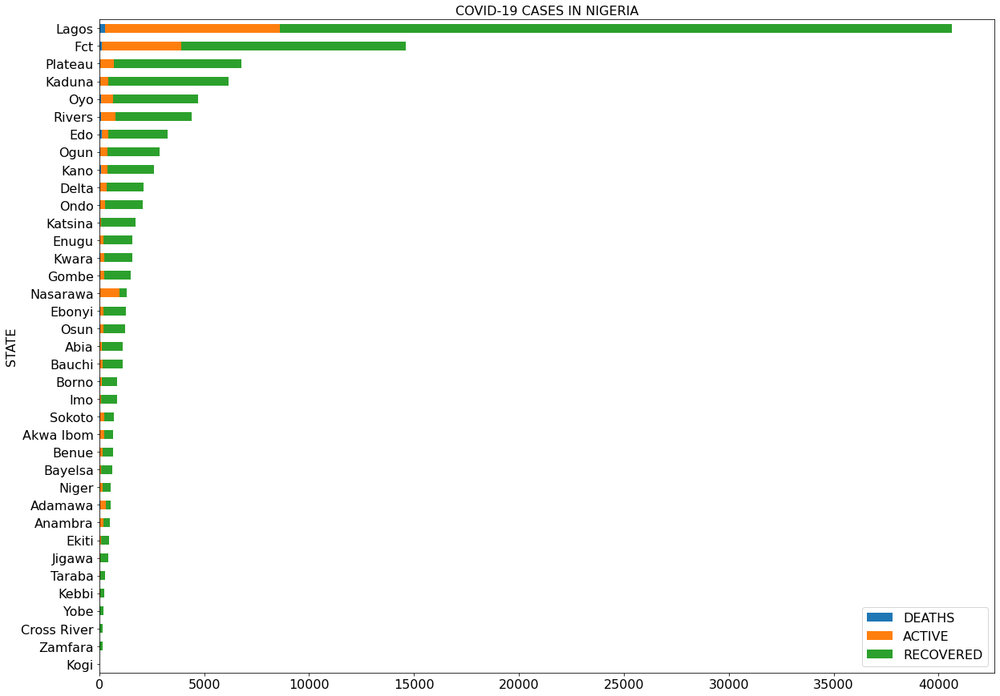

In [69]:
ax = COVID19_Cases.plot.barh(stacked=True);

ax.figure.set_size_inches(20,15)
ax.tick_params(axis='x', labelsize=16)
ax.tick_params(axis='y', labelsize=16)
ax.yaxis.label.set_size(16)
ax.set_title("COVID-19 CASES IN NIGERIA",fontsize=16)
ax.legend(loc='lower right',fontsize=16)

In [70]:
COVID19_Deaths=COVID19_Cases[['DEATHS']].copy()

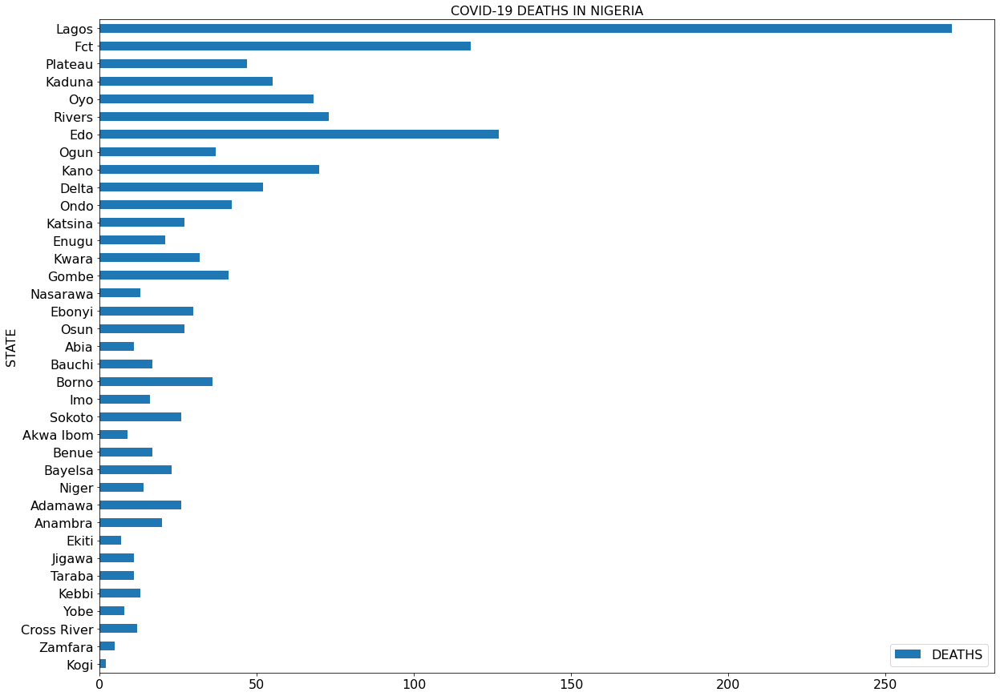

In [71]:
ax = COVID19_Deaths.plot.barh(stacked=True);

ax.figure.set_size_inches(20,15)
ax.tick_params(axis='x', labelsize=16)
ax.tick_params(axis='y', labelsize=16)
ax.yaxis.label.set_size(16)
ax.set_title("COVID-19 DEATHS IN NIGERIA",fontsize=16)
ax.legend(loc='lower right',fontsize=16)

## Calculating Health_Access using FourSquare data as Number of Hospitals per One Million people

In [73]:
FS_HealthAccess=FSData[['STATE','No_of_Hospitals']].copy()
FS_HealthAccess['Population']=Population.iloc[:,-1:] #adding the column for 2016 population (last column of population dataframe)
FS_HealthAccess['Population_per_1000k']=FS_HealthAccess['Population']/1000000 #calculating 
FS_HealthAccess['Hospitals_per_1000k']=FS_HealthAccess['No_of_Hospitals']/FS_HealthAccess['Population_per_1000k']
FS_HealthAccess.head()

,STATE,No_of_Hospitals,Population,Population_per_1000k,Hospitals_per_1000k
0,Abia,5,3.727347e+06,3.727347,1.341437
1,Adamawa,7,4.248436e+06,4.248436,1.647665
2,Akwa Ibom,4,5.482177e+06,5.482177,0.729637
3,Anambra,35,5.527809e+06,5.527809,6.331623
4,Bauchi,8,6.537314e+06,6.537314,1.223744


In [74]:
# create a map of Nigeria for Health_Access Index Using FourSquare Data
address = 'Nigeria'

geolocator = Nominatim(user_agent="Naij_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Nigeria are {}, {}.'.format(latitude, longitude))

#Create Nigeria Map
Naija_map4 = folium.Map(location=[latitude, longitude], zoom_start=6)

The geograpical coordinate of Nigeria are 9.6000359, 7.9999721.


In [76]:
# generate choropleth map for Health_Access Index Using FourSquare Data
Naija_map4.choropleth(
    geo_data=naija_geo,
    data=FS_HealthAccess,
    columns=['STATE', 'Hospitals_per_1000k'],
    key_on='properties.statename',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Health Access Index in Nigeria (Based on Foursquare Search)'
)

# display map
Naija_map4

## Creating A single Dataframe with COVID details, Health Care Access, and Economic Indicators

In [77]:
#Combining 
Combined_Data=FS_HealthAccess[['STATE','Population','Population_per_1000k','No_of_Hospitals','Hospitals_per_1000k']].copy()
Combined_Data['Govt_HealthAccess_Index']=HealthAccess['HEALTH_ACCESS']
Combined_Data['Unemployment_Rate_%']=Employment['New-Nig Unempl Rate']
Combined_Data['Consumer_Price_Index']=CPI['All-Nov20']
Combined_Data['COVID19_Tests']=COVID19_data['SCREENED']
Combined_Data['COVID19_Cases']=COVID19_data['CASES']
Combined_Data['COVID19_Deaths']=COVID19_data['DEATHS']
Combined_Data['COVID19_Recovered']=COVID19_data['RECOVERED']
Combined_Data['COVID19_Active']=COVID19_data['ACTIVE']
Combined_Data['State_Acreage_sqkm']=COVID19_data['AREA']
Combined_Data['Population_per_sqkm']=Combined_Data['Population']/Combined_Data['State_Acreage_sqkm']

In [78]:
Combined_Data.head()

,STATE,Population,Population_per_1000k,No_of_Hospitals,Hospitals_per_1000k,Govt_HealthAccess_Index,Unemployment_Rate_%,Consumer_Price_Index,COVID19_Tests,COVID19_Cases,COVID19_Deaths,COVID19_Recovered,COVID19_Active,State_Acreage_sqkm,Population_per_sqkm
0,Abia,3.727347e+06,3.727347,5,1.341437,1.957754,35.545544,348.44,14627,1134,11,1014,109,4858.88,767.120540
1,Adamawa,4.248436e+06,4.248436,7,1.647665,2.054538,29.264416,341.98,8733,540,26,238,276,37924.99,112.022077
2,Akwa Ibom,5.482177e+06,5.482177,4,0.729637,2.731196,45.152935,345.23,7312,667,9,422,236,6723.20,815.411880
3,Anambra,5.527809e+06,5.527809,35,6.331623,1.773679,13.132447,357.68,11890,515,20,334,161,4807.93,1149.727383
4,Bauchi,6.537314e+06,6.537314,8,1.223744,1.816598,21.903848,396.99,13917,1107,17,964,126,48496.40,134.799982


In [79]:
Combined_Data.dtypes

STATE                       object
Population                 float64
Population_per_1000k       float64
No_of_Hospitals              int64
Hospitals_per_1000k        float64
Govt_HealthAccess_Index    float64
Unemployment_Rate_%        float64
Consumer_Price_Index       float64
COVID19_Tests                int64
COVID19_Cases                int64
COVID19_Deaths               int64
COVID19_Recovered            int64
COVID19_Active               int64
State_Acreage_sqkm         float64
Population_per_sqkm        float64
dtype: object

In [80]:
Combined_Data.corr()

,Population,Population_per_1000k,No_of_Hospitals,Hospitals_per_1000k,Govt_HealthAccess_Index,Unemployment_Rate_%,Consumer_Price_Index,COVID19_Tests,COVID19_Cases,COVID19_Deaths,COVID19_Recovered,COVID19_Active,State_Acreage_sqkm,Population_per_sqkm
Population,1.000000,1.000000,0.175776,-0.156649,-0.051665,0.091649,0.028200,0.586572,0.528226,0.562220,0.544127,0.453879,-0.012277,0.552372
Population_per_1000k,1.000000,1.000000,0.175776,-0.156649,-0.051665,0.091649,0.028200,0.586572,0.528226,0.562220,0.544127,0.453879,-0.012277,0.552372
No_of_Hospitals,0.175776,0.175776,1.000000,0.887922,0.078668,-0.370007,0.032932,0.478522,0.484604,0.409435,0.474328,0.512359,-0.368548,0.547261
Hospitals_per_1000k,-0.156649,-0.156649,0.887922,1.000000,-0.019579,-0.408891,0.009807,0.207749,0.178827,0.128498,0.160267,0.244719,-0.370761,0.223142
Govt_HealthAccess_Index,-0.051665,-0.051665,0.078668,-0.019579,1.000000,-0.187732,0.137046,-0.109483,-0.025956,-0.112641,-0.016290,-0.058316,0.242846,-0.071793
Unemployment_Rate_%,0.091649,0.091649,-0.370007,-0.408891,-0.187732,1.000000,-0.345866,0.050344,-0.044533,-0.066245,-0.035926,-0.074615,-0.014792,0.020904
Consumer_Price_Index,0.028200,0.028200,0.032932,0.009807,0.137046,-0.345866,1.000000,0.009333,0.053523,0.069273,0.061159,0.023184,0.254698,-0.125587
COVID19_Tests,0.586572,0.586572,0.478522,0.207749,-0.109483,0.050344,0.009333,1.000000,0.949769,0.914559,0.946079,0.939290,-0.282741,0.767300
COVID19_Cases,0.528226,0.528226,0.484604,0.178827,-0.025956,-0.044533,0.053523,0.949769,1.000000,0.919447,0.998664,0.980934,-0.245550,0.817813
COVID19_Deaths,0.562220,0.562220,0.409435,0.128498,-0.112641,-0.066245,0.069273,0.914559,0.919447,1.000000,0.921098,0.886075,-0.252275,0.720981


In [82]:
Combined_Data[['Hospitals_per_1000k','COVID19_Cases','COVID19_Deaths','Unemployment_Rate_%','Consumer_Price_Index','Govt_HealthAccess_Index','Population_per_sqkm','COVID19_Tests']].corr()

,Hospitals_per_1000k,COVID19_Cases,COVID19_Deaths,Unemployment_Rate_%,Consumer_Price_Index,Govt_HealthAccess_Index,Population_per_sqkm,COVID19_Tests
Hospitals_per_1000k,1.000000,0.178827,0.128498,-0.408891,0.009807,-0.019579,0.223142,0.207749
COVID19_Cases,0.178827,1.000000,0.919447,-0.044533,0.053523,-0.025956,0.817813,0.949769
COVID19_Deaths,0.128498,0.919447,1.000000,-0.066245,0.069273,-0.112641,0.720981,0.914559
Unemployment_Rate_%,-0.408891,-0.044533,-0.066245,1.000000,-0.345866,-0.187732,0.020904,0.050344
Consumer_Price_Index,0.009807,0.053523,0.069273,-0.345866,1.000000,0.137046,-0.125587,0.009333
Govt_HealthAccess_Index,-0.019579,-0.025956,-0.112641,-0.187732,0.137046,1.000000,-0.071793,-0.109483
Population_per_sqkm,0.223142,0.817813,0.720981,0.020904,-0.125587,-0.071793,1.000000,0.767300
COVID19_Tests,0.207749,0.949769,0.914559,0.050344,0.009333,-0.109483,0.767300,1.000000


Text(0.5, 1.0, 'COVID19 Deaths in Nigeria vs. Health Access')

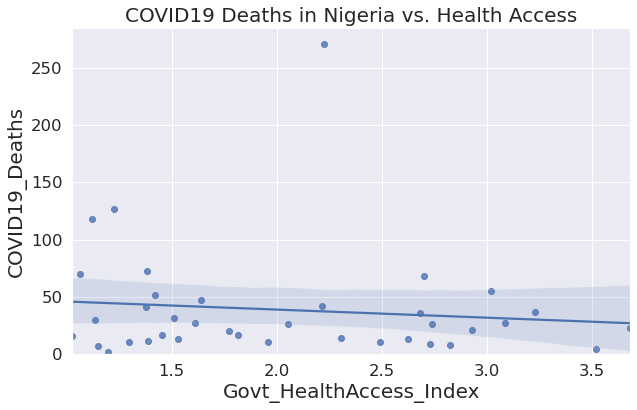

In [83]:
plt.figure(figsize=(10,6))
sns.set(font_scale = 1.5)
sns.regplot(x='Govt_HealthAccess_Index',y='COVID19_Deaths',data=Combined_Data)
plt.ylim(0,)
plt.xlabel('Govt_HealthAccess_Index',size=20)
plt.ylabel('COVID19_Deaths',size=20)
plt.title('COVID19 Deaths in Nigeria vs. Health Access',size=20)

Text(0.5, 1.0, 'COVID19 Deaths in Nigeria vs. Unemployment Rate')

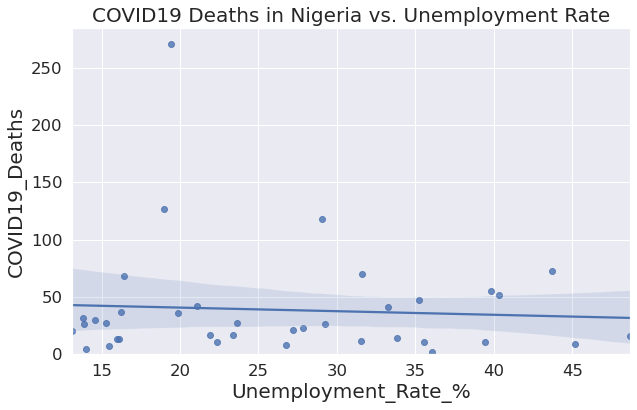

In [84]:
plt.figure(figsize=(10,6))
sns.set(font_scale = 1.5)
sns.regplot(x='Unemployment_Rate_%',y='COVID19_Deaths',data=Combined_Data)
plt.ylim(0,)
plt.xlabel('Unemployment_Rate_%',size=20)
plt.ylabel('COVID19_Deaths',size=20)
plt.title('COVID19 Deaths in Nigeria vs. Unemployment Rate',size=20)

Text(0.5, 1.0, 'COVID19 Deaths in Nigeria vs. Consumer Price Index')

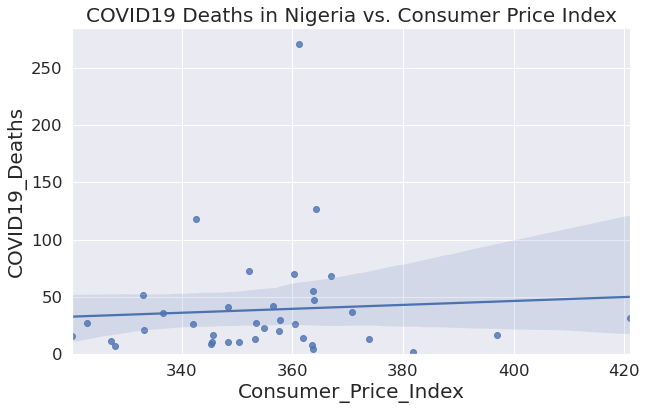

In [85]:
plt.figure(figsize=(10,6))
sns.set(font_scale = 1.5)
sns.regplot(x='Consumer_Price_Index',y='COVID19_Deaths',data=Combined_Data)
plt.ylim(0,)
plt.xlabel('Consumer_Price_Index',size=20)
plt.ylabel('COVID19_Deaths',size=20)
plt.title('COVID19 Deaths in Nigeria vs. Consumer Price Index',size=20)

Text(0.5, 1.0, 'COVID19 Deaths in Nigeria vs. FourSquare Hospitals_per_1000k')

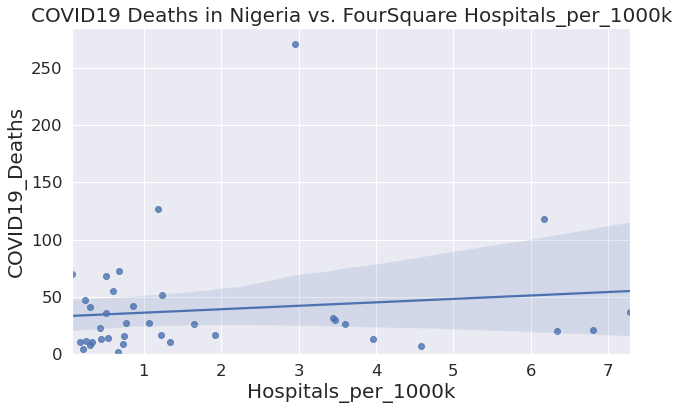

In [86]:
plt.figure(figsize=(10,6))
sns.set(font_scale = 1.5)
sns.regplot(x='Hospitals_per_1000k',y='COVID19_Deaths',data=Combined_Data)
plt.ylim(0,)
plt.xlabel('Hospitals_per_1000k',size=20)
plt.ylabel('COVID19_Deaths',size=20)
plt.title('COVID19 Deaths in Nigeria vs. FourSquare Hospitals_per_1000k',size=20)

Text(0.5, 1.0, 'COVID19 Deaths in Nigeria vs.Population_per_sqkm')

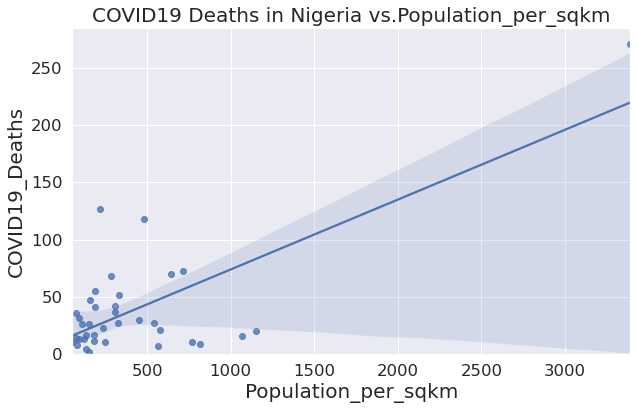

In [87]:
plt.figure(figsize=(10,6))
sns.set(font_scale = 1.5)
sns.regplot(x='Population_per_sqkm',y='COVID19_Deaths',data=Combined_Data)
plt.ylim(0,)
plt.xlabel('Population_per_sqkm',size=20)
plt.ylabel('COVID19_Deaths',size=20)
plt.title('COVID19 Deaths in Nigeria vs.Population_per_sqkm',size=20)

Text(0.5, 1.0, 'COVID19 Cases in Nigeria vs. Unemployment Rate')

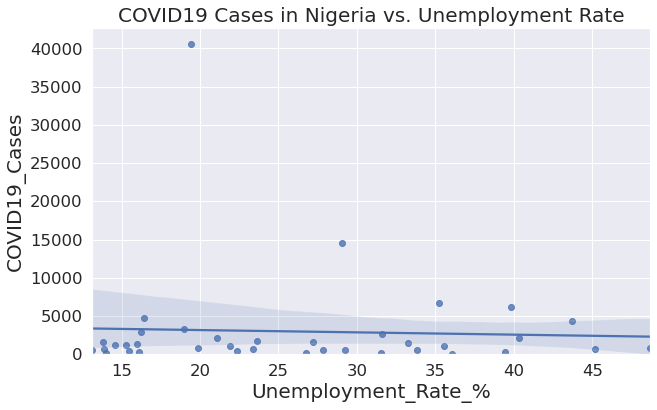

In [88]:
plt.figure(figsize=(10,6))
sns.set(font_scale = 1.5)
sns.regplot(x='Unemployment_Rate_%',y='COVID19_Cases',data=Combined_Data)
plt.ylim(0,)
plt.xlabel('Unemployment_Rate_%',size=20)
plt.ylabel('COVID19_Cases',size=20)
plt.title('COVID19 Cases in Nigeria vs. Unemployment Rate',size=20)

Text(0.5, 1.0, 'COVID19 Cases in Nigeria vs. Consumer Price Index')

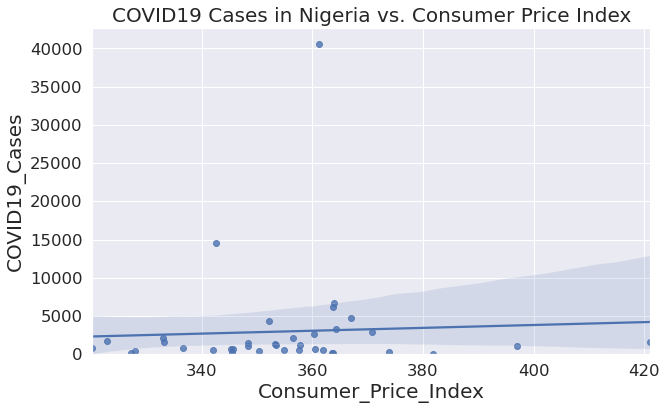

In [89]:
plt.figure(figsize=(10,6))
sns.set(font_scale = 1.5)
sns.regplot(x='Consumer_Price_Index',y='COVID19_Cases',data=Combined_Data)
plt.ylim(0,)
plt.xlabel('Consumer_Price_Index',size=20)
plt.ylabel('COVID19_Cases',size=20)
plt.title('COVID19 Cases in Nigeria vs. Consumer Price Index',size=20)

Text(0.5, 1.0, 'COVID19 Cases in Nigeria vs.Population_per_sqkm')

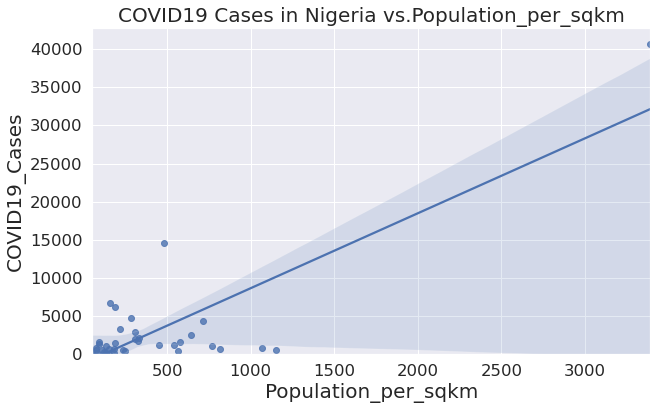

In [90]:
plt.figure(figsize=(10,6))
sns.set(font_scale = 1.5)
sns.regplot(x='Population_per_sqkm',y='COVID19_Cases',data=Combined_Data)
plt.ylim(0,)
plt.xlabel('Population_per_sqkm',size=20)
plt.ylabel('COVID19_Cases',size=20)
plt.title('COVID19 Cases in Nigeria vs.Population_per_sqkm',size=20)

Text(0.5, 1.0, 'COVID19 Testing in Nigeria vs.Population_per_sqkm')

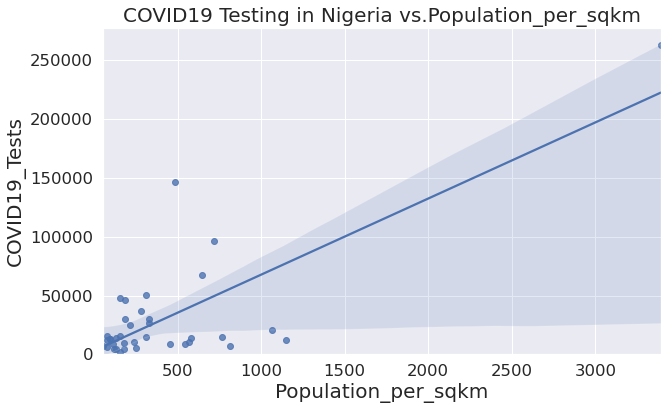

In [91]:
plt.figure(figsize=(10,6))
sns.set(font_scale = 1.5)
sns.regplot(x='Population_per_sqkm',y='COVID19_Tests',data=Combined_Data)
plt.ylim(0,)
plt.xlabel('Population_per_sqkm',size=20)
plt.ylabel('COVID19_Tests',size=20)
plt.title('COVID19 Testing in Nigeria vs.Population_per_sqkm',size=20)